In [ ]:
import sys
sys.path.append("..")

In [1]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

ST_PATH= "/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled_sum_10000.h5ad"
MSI_PATH= "/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi.h5ad"

st = ad.read_h5ad(ST_PATH)
msi = ad.read_h5ad(MSI_PATH)

gw_params = dict(verbose=True, inner_maxit=3000, outer_maxit = 3000, inner_tol=1e-8,   outer_tol=1e-8,   epsilon=1e-4)


In [2]:
import os, random, numpy as np, torch

def seed_everything(seed: int = 42):
    """Set global seed for reproducibility across common libraries."""
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)

    try:
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    except Exception:
        pass  # torch not installed or not used

    print(f"✅ Global seed set to {seed}")

GLOBAL_SEED = 42
seed_everything(GLOBAL_SEED)


✅ Global seed set to 42


In [3]:
import mgw.mgw as mgw
import scanpy as sc
from mgw import util
from mgw import gw

import importlib
importlib.reload(gw)
importlib.reload(mgw)
importlib.reload(util)

pre = mgw.mgw_preprocess(
    st, msi,
    PCA_comp=100,
    CCA_comp=40,
    use_cca_feeler=True,
    use_pca_X=True,
    use_pca_Z=True,
    log1p_X=True,
    log1p_Z=True,
    verbose=True,
    feature_only=False,
    spatial_only=False
)


/home/ph3641/ManifoldAlignment/mgw/util.py:247: UserWarning: Ignoring svd_solver='auto' and using randomized, sklearn.decomposition._truncated_svd.TruncatedSVD only supports dict_keys(['arpack', 'randomized']).
  sc.tl.pca(


[mgw.pre] PCA/raw shapes: X=(10000, 100)  Z=(4269, 100)
[mgw.pre] CCA feeler: PCA → small GW (fused) → barycentric → CCA
Using precomputed PCA (100 comps).
Using precomputed PCA (100 comps).
Feature shapes -> X: (10000, 100) Z: (4269, 100)
Feeler GW sizes: X-side 8000, Z-side 4269
Solving feeler feature alignment.
Computing CCA Components
CCA dims: 40  (applied to full sets)


[mgw.core] device=cuda dtype=torch.float64
[mgw.core] dims: E=2, F_M=40, F_N=40
[mgw.core] training φ, ψ
[train_phi] step=1000 loss=0.022125
[train_phi] step=2000 loss=0.020534
[train_phi] step=3000 loss=0.019879
[train_phi] step=4000 loss=0.019374
[train_phi] step=5000 loss=0.019024
[train_phi] step=6000 loss=0.018764
[train_phi] step=7000 loss=0.018468
[train_phi] step=8000 loss=0.018307
[train_phi] step=9000 loss=0.018072
[train_phi] step=10000 loss=0.017933
[train_phi] step=11000 loss=0.017811
[train_phi] step=12000 loss=0.017628
[train_phi] step=13000 loss=0.017528
[train_phi] step=14000 loss=0.017440
[train_phi] step=15000 loss=0.017322
[train_phi] step=16000 loss=0.017302
[train_phi] step=17000 loss=0.017179
[train_phi] step=18000 loss=0.017158
[train_phi] step=19000 loss=0.017075
[train_phi] step=20000 loss=0.017058
[train_phi] step=1000 loss=0.024869
[train_phi] step=2000 loss=0.024496
[train_phi] step=3000 loss=0.023788
[train_phi] step=4000 loss=0.023329
[train_phi] step=500

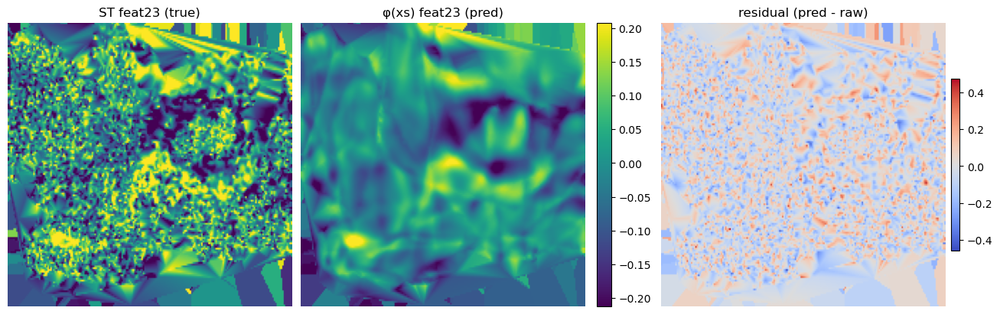

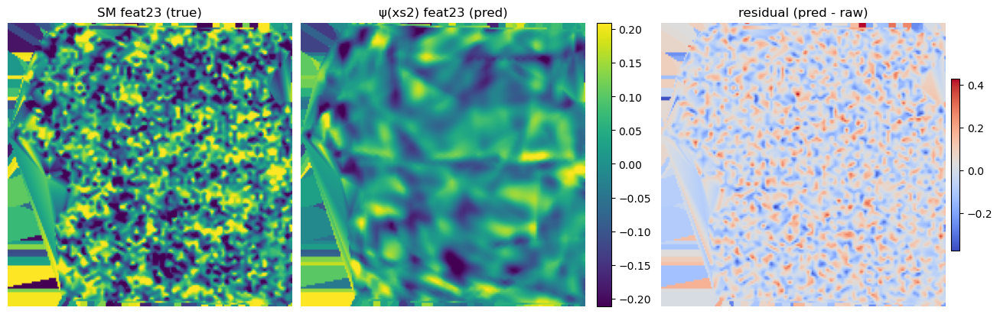

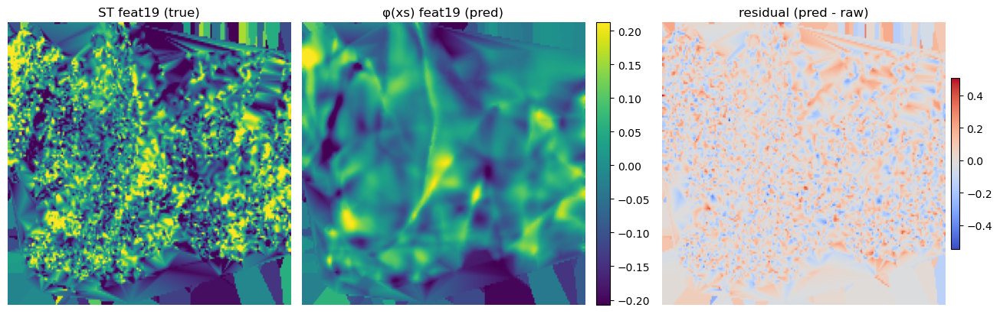

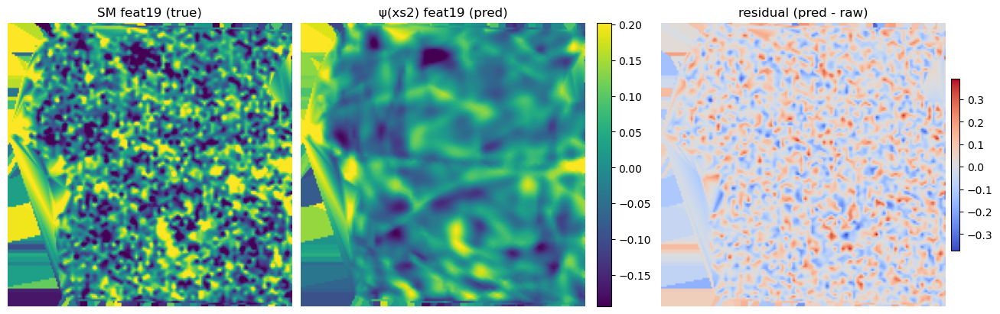

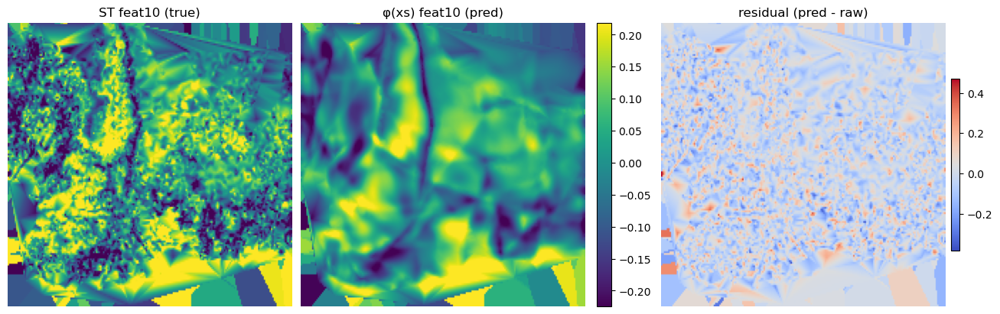

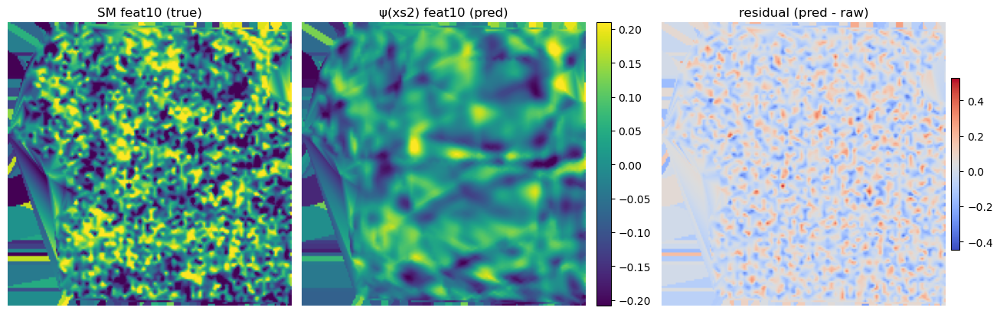

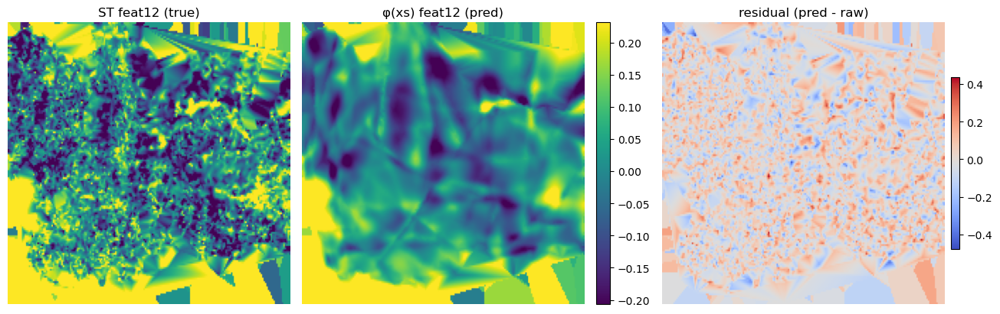

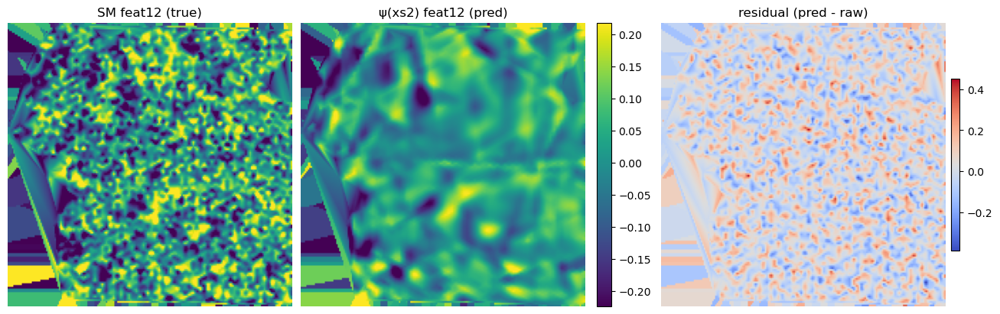

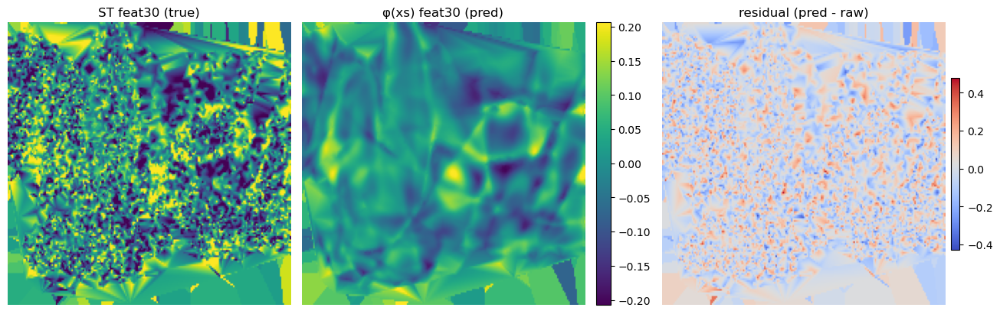

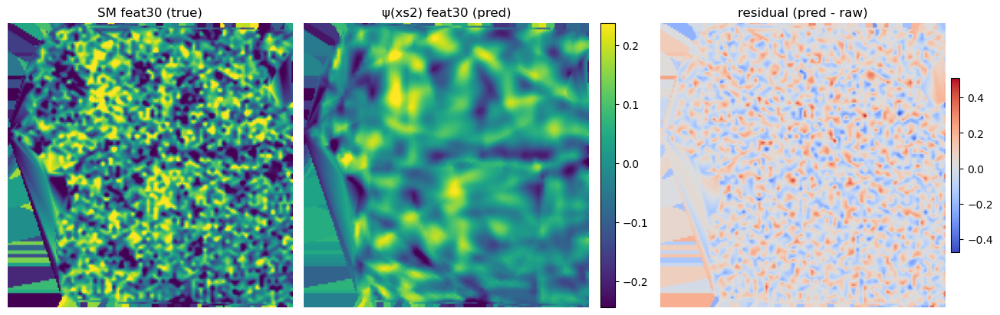

[mgw.core] pullback metrics & geodesics
Rescaling Jacobians by 254.66253183582336.
Rescaling Jacobians by 357.99680566364725.
[mgw.core] solving GW with {'verbose': True, 'inner_maxit': 3000, 'outer_maxit': 3000, 'inner_tol': 1e-08, 'outer_tol': 1e-08, 'epsilon': 0.0001}
[mgw.core] coupling: shape=(10000, 4269), mass=0.999999


(10000, 4269)

In [4]:

out = mgw.mgw_align_core(
    pre,
    widths=(128,256,256,128),
    lr=1e-3,
    niter=20_000,
    knn_k=12,
    geodesic_eps=1e-2,
    save_dir="/scratch/gpfs/ph3641/visxe",
    tag="Vis_Xen_crc_CCA_10k_4",
    verbose=True,
    plot_net=True,
    gw_params = gw_params
)

P_vixe = out["P"]
P_vixe.shape

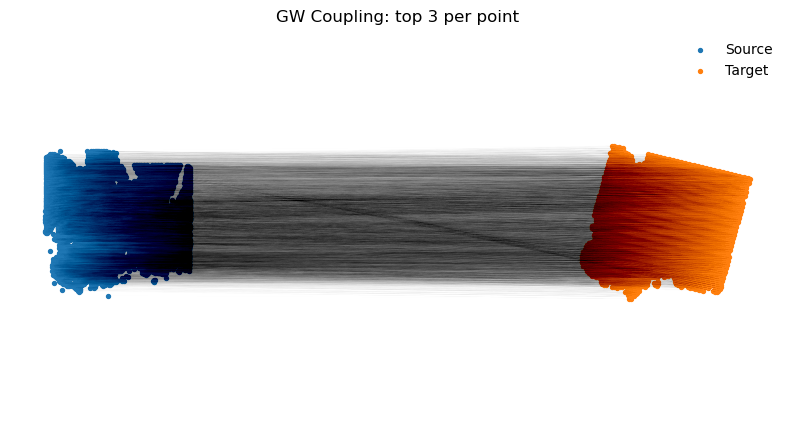

In [5]:
from mgw import plotting
import numpy as np
from mgw import plotting
importlib.reload(plotting)

xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_vixe)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_vixe, alpha=0.005)

In [6]:
import scipy.sparse as sp
from scipy.spatial.distance import cosine
from scipy.stats import pearsonr
from mgw.util import _barycentric_right

import numpy as np
import scipy.sparse as sp
import scanpy as sc
from scipy.stats import pearsonr

def _to_numpy(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def per_gene_cosine_under_coupling(
    adata_source,   # e.g., Xenium (cells)
    adata_target,   # e.g., Visium (spots)
    P,              # shape (n_target, n_source)
    log1p=True,
    scale=True,
    eps=1e-12,
    return_pearson=False
):
    """
    Per-gene cosine similarity between adata_target.X and the barycentric
    projection of adata_source.X via coupling P.

    Returns:
        dict with:
          - 'genes': np.array of common gene names in order
          - 'cosine': np.array of per-gene cosine similarities
          - (optional) 'pearson': np.array of per-gene Pearson correlations
          - 'summary': dict with aggregates (mean/median)
    """
    a_src = adata_source.copy()
    a_tgt = adata_target.copy()
    a_src.var_names_make_unique()
    a_tgt.var_names_make_unique()

    if log1p:
        sc.pp.log1p(a_src); sc.pp.log1p(a_tgt)
    if scale:
        # scale per gene so cosine is not dominated by highly variable genes
        sc.pp.scale(a_src, zero_center=True, max_value=None)
        sc.pp.scale(a_tgt, zero_center=True, max_value=None)

    # Intersect genes and align order
    common = a_src.var_names.intersection(a_tgt.var_names)
    if len(common) == 0:
        raise ValueError("No shared genes between datasets.")
    common = common.sort_values()
    a_src = a_src[:, common].copy()
    a_tgt = a_tgt[:, common].copy()

    Xs = _to_numpy(a_src.X)  # (n_source, G)
    Xt = _to_numpy(a_tgt.X)  # (n_target, G)

    P = P.toarray() if sp.issparse(P) else np.asarray(P)
    n_t, n_s = Xt.shape[0], Xs.shape[0]
    if P.shape != (n_t, n_s):
        raise ValueError(f"P shape {P.shape} must be (n_target={n_t}, n_source={n_s}).")

    # Barycentric projection of source -> target
    row_sums = P.sum(axis=1, keepdims=True) + eps
    Xs_proj = (P @ Xs) / row_sums  # (n_target, G)

    # Per-gene cosine: cos(a,b) = (a·b) / (||a|| ||b||)
    num = (Xt * Xs_proj).sum(axis=0)
    Xt_norm = np.linalg.norm(Xt, axis=0) + eps
    Xp_norm = np.linalg.norm(Xs_proj, axis=0) + eps
    cos = num / (Xt_norm * Xp_norm)

    out = {
        "genes": np.asarray(common.values, dtype=str),
        "cosine": cos,
        "summary": {"mean_cosine": float(np.mean(cos)), "median_cosine": float(np.median(cos))}
    }

    if return_pearson:
        pear = np.array([pearsonr(Xt[:, g], Xs_proj[:, g])[0] for g in range(Xt.shape[1])])
        out["pearson"] = pear
        out["summary"].update(
            mean_pearson=float(np.nanmean(pear)),
            median_pearson=float(np.nanmedian(pear))
        )

    return out

In [43]:
res = per_gene_cosine_under_coupling(msi, st, P_vixe,scale=False)
res["summary"]

{'mean_cosine': 0.6712460517883301, 'median_cosine': 0.6892294883728027}

In [44]:
from mgw import metrics
res = metrics.migration_metrics(xs, xs2, P_vixe, use_procrustes=True, p=2)
res['expected_disp_p']

0.014474236958333823

In [24]:
K=10000
XE_PATH= f"/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled_sum_{K}.h5ad"
VI_PATH= "/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi.h5ad"

adata_xenium = sc.read_h5ad(XE_PATH)
adata_visium = sc.read_h5ad(VI_PATH)
P_PATH = '/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/crc/'
DATASET_NAME = f'CRC_sum_{K}'

In [25]:
P_brca = sp.load_npz(P_PATH+f'P_mgw_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.7094391584396362, 'median_cosine': 0.721759021282196}

In [27]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.2091357482049481

In [28]:
P_brca = sp.load_npz(P_PATH+f'P_spatialgw_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.6599059700965881, 'median_cosine': 0.6805340051651001}

In [29]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.21839704569435944

In [30]:
P_brca = sp.load_npz(P_PATH+f'P_featuregw_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.7437325119972229, 'median_cosine': 0.7531275749206543}

In [31]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.23863534178910376

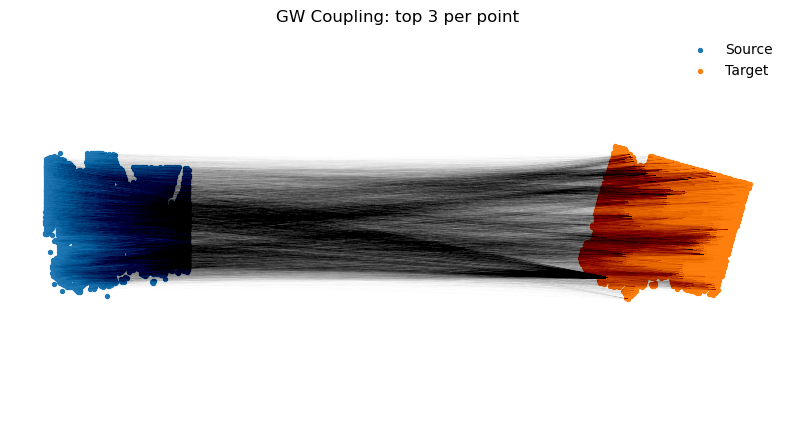

In [12]:
'''
xs = out["xs"]
xs2 = out["xs2"]

P_brca = sp.load_npz(P_PATH+f'P_featuregw_{DATASET_NAME}.npz')
P = P_brca.toarray().astype(np.float64, copy=False)

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P )
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P, alpha=0.005)
'''

In [32]:
P_brca = sp.load_npz(P_PATH+f'P_moscot_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.7416129112243652, 'median_cosine': 0.7537705898284912}

In [34]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.23366500005513682

/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


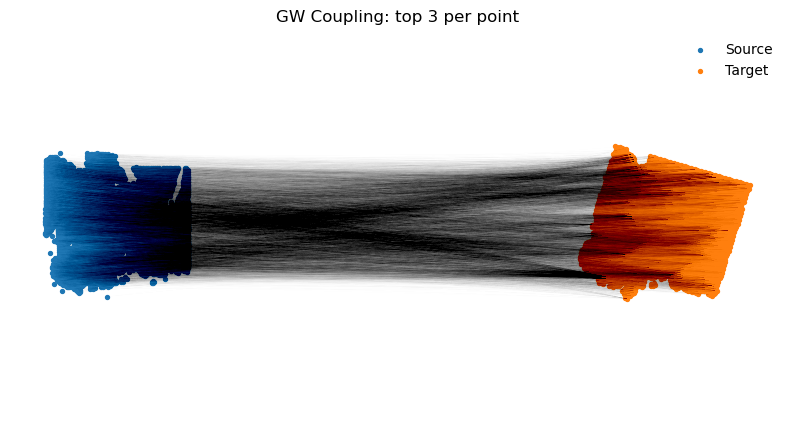

In [14]:

xs = out["xs"]
xs2 = out["xs2"]

'''
P_brca = sp.load_npz(P_PATH+f'P_moscot_{DATASET_NAME}.npz')
P = P_brca.toarray().astype(np.float64, copy=False)

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P )
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P, alpha=0.005)
'''

In [15]:
P_brca = sp.load_npz(P_PATH+f'P_scotv1_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.6648324637583289, 'median_cosine': 0.6937531264340652}

In [36]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.23366500005513682

In [37]:
P_brca = sp.load_npz(P_PATH+f'P_scotv2_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.7137649989732668, 'median_cosine': 0.7246853478851697}

In [38]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.24760015609449323

In [39]:
P_brca = sp.load_npz(P_PATH+f'P_paste_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.4370304088217665, 'median_cosine': 0.4551490912678309}

In [40]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.0012193209331708438

In [41]:
P_brca = sp.load_npz(P_PATH+f'P_pot_{DATASET_NAME}.npz')
#coupling_similarity_overall(adata_xenium,adata_visium,P_brca,scale=False)
res = per_gene_cosine_under_coupling(adata_visium,adata_xenium,P_brca,scale=False)
res["summary"]

{'mean_cosine': 0.7219998256127798, 'median_cosine': 0.7384803658123805}

In [42]:
P = P_brca.toarray().astype(np.float64, copy=False)
res = metrics.migration_metrics(xs, xs2, P, use_procrustes=True, p=2)
res['expected_disp_p']

0.27770939172510484

In [ ]:


from mgw import plotting
import numpy as np
from mgw import plotting
importlib.reload(plotting)

xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_vixe)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_vixe, alpha=0.005)

Rescaling Jacobians by 254.66253183582336.
Rescaling Jacobians by 357.99680566364725.


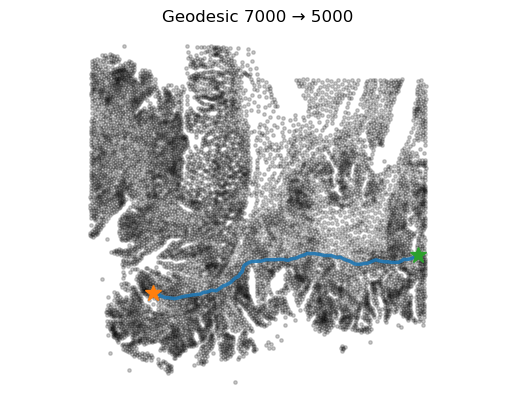

In [6]:
from mgw import util, models, plotting, geometry
from mgw import pullback_metric_field, knn_graph

xs = out["xs"]
xs2 = out["xs2"]
phi = out["phi"]
psi = out["psi"]
device = 'cuda'
geodesic_eps = 0.001 #0.1 #0 #.000000001
knn_k=12
G_M = geometry.pullback_metric_field(phi, torch.from_numpy(xs).to(device), eps=geodesic_eps).cpu()
G_N = geometry.pullback_metric_field(psi, torch.from_numpy(xs2).to(device), eps=geodesic_eps).cpu()

Gs = knn_graph(xs,  k=knn_k)
Gt = knn_graph(xs2, k=knn_k)

W_M = plotting.build_weighted_graph(xs, G_M, Gs)         # build once

# pick any pair (i, j)
i, j = 7000, 5000
_, pred = plotting.geodesics_from_source(W_M, i)             # O(|E| log |V|)
path, ok = plotting.traceback_path(pred, i, j)
plotting.plot_geodesic(xs, path, title=f'Geodesic {i} → {j}')


In [7]:
P_vixe

array([[2.4864081e-11, 1.2564890e-07, 4.8241747e-21, ..., 3.8843664e-12,
        3.2496578e-17, 2.1467792e-09],
       [1.0251209e-08, 1.6936397e-12, 4.9492033e-10, ..., 1.6665390e-07,
        2.4926282e-30, 5.8335625e-19],
       [6.0880216e-09, 5.1561009e-11, 1.3943210e-10, ..., 1.5400229e-07,
        1.1366341e-29, 5.6251284e-18],
       ...,
       [1.9178128e-20, 2.8575844e-22, 3.5393612e-08, ..., 1.3281694e-16,
        1.8669499e-41, 3.9837779e-34],
       [5.5436513e-09, 1.1250830e-08, 1.7963302e-17, ..., 4.0812593e-09,
        2.1409410e-23, 3.1466702e-12],
       [0.0000000e+00, 3.1921265e-36, 0.0000000e+00, ..., 0.0000000e+00,
        8.8116103e-17, 1.3617896e-30]], dtype=float32)

/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


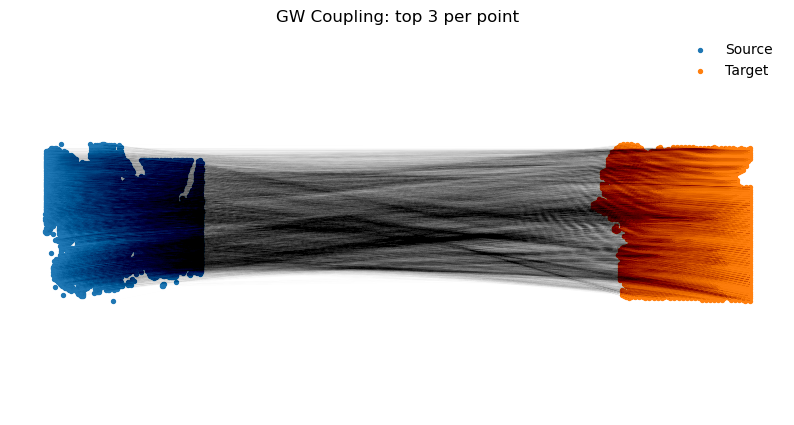

In [8]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

plotting.plot_alignment_lines_dense(xs, xs2, P_vixe, alpha=0.005)

In [9]:
import numpy as np
from mgw import plotting
importlib.reload(plotting)

'''
# --- helpers ---
def random_rotation(d, rng=None):
    rng = np.random.default_rng() if rng is None else rng
    A = rng.normal(size=(d, d))
    Q, R = np.linalg.qr(A)
    # enforce det(Q) = +1 (proper rotation)
    if np.linalg.det(Q) < 0:
        Q[:, -1] *= -1
    return Q

# --- inputs you already have ---
# xs = out["xs"]  # shape (n, d)
# plotting.procrustes_from_coupling is your function

n, d = xs.shape
rng = np.random.default_rng(0)

# ground-truth transform
R_true = random_rotation(d, rng)
t_true = rng.normal(size=(d,)) * 0.0  # set to 0 for pure rotation; bump if you want translation

# create target by transforming xs
ys = xs @ R_true + t_true

# (optional) add tiny noise to make it non-degenerate
ys_noisy = ys + 1e-6 * rng.normal(size=ys.shape)

# trivial one-to-one coupling: diagonal (sum can be n; normalization not required)
P = np.eye(n, dtype=float)  # uniform 1 on diagonal

# run Procrustes (align Y to X)
xs_aligned, ys_aligned, R_est, t_est = plotting.procrustes_from_coupling(
    xs, ys_noisy, P
)

# diagnostics
rot_err = np.linalg.norm(R_est - R_true, ord='fro')
trans_err = np.linalg.norm(t_est - t_true)
after_align_err = np.sqrt(((xs_aligned - ys_aligned)**2).sum(axis=1))
print(f"Rotation Frobenius error: {rot_err:.3e}")
print(f"Translation L2 error:     {trans_err:.3e}")
print(f"Alignment RMSE:            {np.sqrt((after_align_err**2).mean()):.3e}")
print(f"Alignment max error:       {after_align_err.max():.3e}")

# plot match lines: should be nearly coincident
plotting.plot_alignment_lines_dense(xs_aligned, ys_aligned, P, alpha=0.2)
'''

'\n# --- helpers ---\ndef random_rotation(d, rng=None):\n    rng = np.random.default_rng() if rng is None else rng\n    A = rng.normal(size=(d, d))\n    Q, R = np.linalg.qr(A)\n    # enforce det(Q) = +1 (proper rotation)\n    if np.linalg.det(Q) < 0:\n        Q[:, -1] *= -1\n    return Q\n\n# --- inputs you already have ---\n# xs = out["xs"]  # shape (n, d)\n# plotting.procrustes_from_coupling is your function\n\nn, d = xs.shape\nrng = np.random.default_rng(0)\n\n# ground-truth transform\nR_true = random_rotation(d, rng)\nt_true = rng.normal(size=(d,)) * 0.0  # set to 0 for pure rotation; bump if you want translation\n\n# create target by transforming xs\nys = xs @ R_true + t_true\n\n# (optional) add tiny noise to make it non-degenerate\nys_noisy = ys + 1e-6 * rng.normal(size=ys.shape)\n\n# trivial one-to-one coupling: diagonal (sum can be n; normalization not required)\nP = np.eye(n, dtype=float)  # uniform 1 on diagonal\n\n# run Procrustes (align Y to X)\nxs_aligned, ys_aligned, R_es

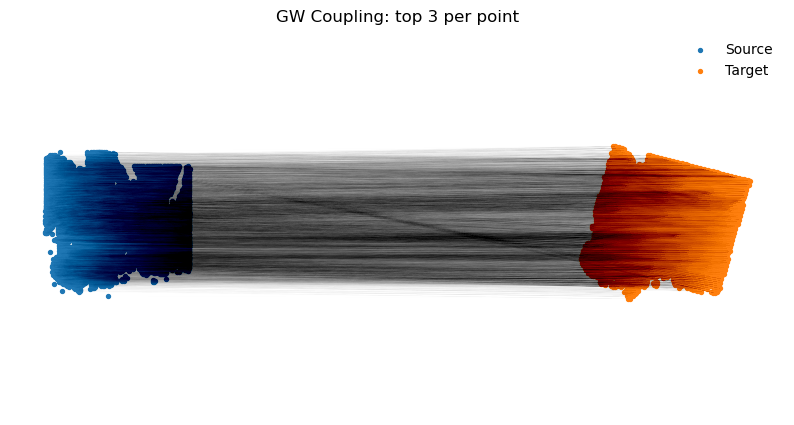

In [10]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_vixe)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_vixe, alpha=0.005)

In [10]:

out = mgw.mgw_align_core(
    pre,
    widths=(128,256,256,128),
    lr=1e-3,
    niter=20_000,
    knn_k=20,
    geodesic_eps=1e-2,
    save_dir="/scratch/gpfs/BRAPHAEL/xenium_visium/experiments",
    tag="Vis_Xen_crc_new_new",
    verbose=True,
    plot_net=True,
    gw_params = gw_params,
    use_cca=True
)

P_vixe = out["P"]
P_vixe.shape

TypeError: mgw_align_core() got an unexpected keyword argument 'use_cca'

In [ ]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

plotting.plot_alignment_lines_dense(xs, xs2, P_vixe, alpha=0.005)

In [12]:
P_moscot= np.load('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_moscot_pca_crc.npy')
xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_moscot)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_moscot, alpha=0.005)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 10000 is different from 34083)

In [ ]:
P_scot = np.load('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_scot_pca_crc.npy')
xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_scot)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_scot, alpha=0.005)

In [ ]:
P_vixe

In [ ]:
np.save('P_manifoldgw_crc.npy', P_vixe)

In [ ]:
from mgw.baselines import SpatialGW, SCOTGW
from moscot.problems.cross_modality import TranslationProblem

In [ ]:
model = SpatialGW(gw_params = gw_params)
P_spatialgw = model.run(xs=pre["xs"],xs2=pre["xs2"])

model = SCOTGW(gw_params = gw_params)
P_scot_pca = model.run(Y=pre["X_feat"],Y2=pre["Z_feat"])

adata_st = st
adata_sm = msi
adata_st.obsm["X_pca"] = pre["X_feat"]
adata_sm.obsm["X_pca"] = pre["Z_feat"]
#adata_st.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled_PCA.h5ad')
#adata_sm.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi_PCA.h5ad')

In [ ]:
adata_st

In [ ]:
adata_sm

In [ ]:
adata_st.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled_PCA.h5ad')
adata_sm.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi_PCA.h5ad')

In [ ]:
tp = TranslationProblem(adata_src=adata_st, adata_tgt=adata_sm)
tp = tp.prepare(src_attr="X_pca", tgt_attr="X_pca")

tp = tp.solve(alpha=1.0, epsilon=1e-3,max_iterations=20_000,threshold=5e-4)

out = tp.solutions
ott_output = out[("src", "tgt")]
P_moscot_pca = ott_output.transport_matrix

In [ ]:
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_pca_mgw_crc.npy', P_vixe)
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_spatialgw_crc.npy', P_spatialgw)
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_scot_pca_crc.npy', P_scot_pca)
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_moscot_pca_crc.npy', P_moscot_pca)